## Imports

In [1]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from pathlib import Path
from time import time
from multiprocessing import cpu_count
import os
import joblib
from time import time
import glob
import re
import xgboost as xgb
from sklearn import tree
from sklearn import ensemble
from sklearn import svm
# from sklearn.linear_model import lasso_path, enet_path
from sklearn import linear_model
from sklearn.preprocessing import StandardScaler, PowerTransformer, RobustScaler
from sklearn.model_selection import train_test_split, cross_val_score
import sklearn.metrics as metrics
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import cross_validate, GridSearchCV, RandomizedSearchCV, HalvingGridSearchCV
from sklearn.utils.class_weight import compute_sample_weight
from scipy.stats import loguniform
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer, KNNImputer
import pprint
import shap


# %%
def write_log(file, message):
    print(message)
    file.write(message + '\n')
 

/home/mouneem/GEMDeCan/GEMDeCan-env/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Data loading and preprocessing

In [2]:
ONLY_MELANOMA = True
DROP_SCORES = True      # discard XCELL's 'ImmuneScore', 'StromaScore' and 'MicroenvironmentScore'
TEST_CLOUG = False      # models trained on all datasets are tested on the Cloughesy dataset
TEST_LP = False          # models trained on all datasets are tested on the Cloughesy dataset
CV_ADAPT = False        # increase k, the number of CV folds, if training didn't converged with previous k
CV_TRAIN = 5            # default number of splits for CV
CV_MAX = 10             # max splits if previous training failed
PLOT_MODE = False       # enable/disable plot figures on the screen

def plot_figure(plt, PLOT_MODE):
    if PLOT_MODE:
        plt.show()

path_interm = Path("../data/intermediate/Deconvolution_paper")
data_version = 'all_deconvolutions_2021-11-02'
# path_deconv = path_interm / 'revision_deconv' / data_version
path_deconv = path_interm / 'deconvolutions_results' # new path with corrected data (XCELL Removed)
dir_save = Path("../data/processed/Deconvolution_paper_revision")
dir_save = dir_save / "data_version-{}".format(data_version)

# setup output dirs
if ONLY_MELANOMA:
    dir_save = dir_save / "only_melanoma"
else:
    dir_save = dir_save / "all_cancer_types"
if DROP_SCORES:
    dir_save = dir_save / "drop_scores"
else:
    dir_save = dir_save / "keep_scores"
if CV_ADAPT:
    dir_save = dir_save / "cv_adapt-{}-{}".format(CV_TRAIN, CV_MAX)
else:
    dir_save = dir_save / "cv-{}".format(CV_TRAIN)    


# 
dir_save_orig = dir_save    
dir_save.mkdir(parents=True, exist_ok=True)

response = pd.read_csv(path_interm / "response_train.csv", index_col=0)

datasets = ['Gide', 'Riaz', 'Hugo']#, 'Cloughesy']

# combine datasets
df_from_each_file = (pd.read_csv(path_deconv / ('all_deconvolutions_' + f + '.txt'), sep='\t', index_col=0 ) for f in datasets)
deconv   = pd.concat(df_from_each_file, ignore_index=True)

# select rows of common_ids between resp and deconv
common_ids = set(response.index).intersection(deconv.index) 
df_all = deconv.loc[common_ids, :]
response = response.loc[df_all.index, :]
# drop variables with unique values
drop_col = [x for x in df_all.columns if df_all[x].unique().size == 1]
if len(drop_col) > 0:
    print("dropping these columns because they have a unique value:")
else:
    print('there is no column with unique value')



for i in drop_col:
    print("    ", i)
matches = [] #['XCELL', 'TAMs', 'CD226']
if DROP_SCORES:
    matches = matches + ['Score']
drop_col = drop_col + [x for x in df_all.columns if any(y in x for y in matches)]
if len(drop_col) > 0:
    df_all.drop(columns=drop_col, inplace=True)
# drop Maha samples
drop_row = [x for x in df_all.index if 'Maha' in x]
if ONLY_MELANOMA:
    drop_row = drop_row + [x for x in df_all.index if 'Snyder' in x]
    drop_row = drop_row + [x for x in df_all.index if 'Cloughesy' in x]
df_all.drop(labels=drop_row, axis=0, inplace=True)
response.drop(labels=drop_row, inplace=True)
# set inf values to nan
to_nan = ~np.isfinite(df_all.values)
nb_nan = to_nan.sum()
if nb_nan != 0:
    print(f"There are {nb_nan} nan values")
    df_all[to_nan] = np.nan
    # impute non finite values (nan, +/-inf)
    # imputer = IterativeImputer(max_iter=100, random_state=0)
    imputer = KNNImputer(n_neighbors=5, weights="distance")
    df_all.loc[:,:] = imputer.fit_transform(df_all.values)
common_col = df_all.columns.values
nb_var = df_all.shape[1]


there is no column with unique value


Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


In [3]:

# rename variables
if data_version == 'all_deconvolutions_2021-11-02':
    dic_rename = {
        'Epidish': 'EpiDISH',
        'Quantiseq': 'quanTIseq',
        'CBSX__': 'CIBERSORTx_CBSX_',
        'CBSX_scRNA-Seq_melanoma_Tirosh_sigmatrix_SuppFig_3-b': 'CBSX_melanoma',
        'CBSX_sigmatrix_HNSCC_Fig2cd': 'CBSX_HNSCC',
        'CBSX_Fig2ab-NSCLC_PBMCs_scRNAseq_sigmatrix': 'CBSX_NSCLC',
        '__': '_',  # clean redundant '_'
        # 'CBSX_LM22': 'CBSX_LM22', new signature, already well mentionned
    }
else:
    dic_rename = {
        'Epidish': 'EpiDISH',
        'Quantiseq': 'quanTIseq',
        'CBSX_Fig2ab-NSCLC_PBMCs_scRNAseq_refsample_single-cell': 'CBSX_NSCLC',
        'CBSX_scRNA-Seq_reference_HNSCC_Puram_et_al_Fig2cd_single-cell': 'CBSX_HNSCC',
        'CBSX_scRNA-Seq_reference_melanoma_Tirosh_SuppFig_3b-d_single-cell': 'CBSX_melanoma',
    }
for key, val in dic_rename.items():
    new_cols = [x.replace(key, val) for x in df_all.columns]
    df_all.columns = new_cols
# add CIBERSORTx method name where it's missing
# not needed with dic_rename's key CBSX__
# new_cols = ['CIBERSORTx_' + x if ('CBSX' in x and not ('EpiDISH' in x or 'DeconRNASeq' in x)) else x for x in df_all.columns]
# df_all.columns = new_cols

if TEST_CLOUG:
    path_data = path_deconv / ('all_deconvolutions_' + 'Cloughesy' + '.txt')
    deconv_cloug = pd.read_csv(path_data, sep='\t', index_col=0)
    deconv_cloug.index = ['Cloughesy_' + x for x in deconv_cloug.index]
    response_cloug = pd.read_csv(path_interm / "response_train.csv", index_col=0)
    common_ids_cloug = set(response_cloug.index).intersection(deconv_cloug.index)
    deconv_cloug = deconv_cloug.loc[common_ids_cloug, :]
    response_cloug = response_cloug.loc[deconv_cloug.index, :]
    if len(drop_col) > 0:
        deconv_cloug.drop(columns=drop_col, inplace=True)
    # set inf values to nan
    to_nan = ~np.isfinite(deconv_cloug.values)
    nb_nan = to_nan.sum()
    if nb_nan != 0:
        print(f"There are {nb_nan} nan values")
        deconv_cloug[to_nan] = np.nan
        # impute non finite values (nan, +/-inf)
        # imputer = IterativeImputer(max_iter=100, random_state=0)
        imputer = KNNImputer(n_neighbors=5, weights="distance")
        deconv_cloug.loc[:,:] = imputer.fit_transform(deconv_cloug.values)
    for key, val in dic_rename.items():
        new_cols = [x.replace(key, val) for x in deconv_cloug.columns]
        deconv_cloug.columns = new_cols

if TEST_LP:
    path_data = path_deconv / ('all_deconvolutions_' + 'LP_FFPE_STAR_RSEM_TPM' + '.txt')
    deconv_lp = pd.read_csv(path_data, sep='\t', index_col=0)
    # deconv_lp.index = ['lphesy_' + x for x in deconv_lp.index]
    response_lp = pd.read_csv(path_interm / "LP_progressionDeces6mois.csv", index_col=0)
    common_ids_lp = set(response_lp.index).intersection(deconv_lp.index)
    deconv_lp = deconv_lp.loc[common_ids_lp, :]
    response_lp = response_lp.loc[deconv_lp.index, :]

    if len(drop_col) > 0:
        deconv_lp.drop(columns=drop_col, inplace=True)
    # set inf values to nan
    to_nan = ~np.isfinite(deconv_lp.values)
    nb_nan = to_nan.sum()
    if nb_nan != 0:
        print(f"There are {nb_nan} nan values")
        deconv_lp[to_nan] = np.nan
        # impute non finite values (nan, +/-inf)
        # imputer = IterativeImputer(max_iter=100, random_state=0)
        imputer = KNNImputer(n_neighbors=5, weights="distance")
        deconv_lp.loc[:,:] = imputer.fit_transform(deconv_lp.values)
    for key, val in dic_rename.items():
        new_cols = [x.replace(key, val) for x in deconv_lp.columns]
        deconv_lp.columns = new_cols
    # add CIBERSORTx method name where it's missing
    # new_cols = ['CIBERSORTx_' + x if ('CBSX' in x and not ('EpiDISH' in x or 'DeconRNASeq' in x)) else x for x in deconv_cloug.columns]
    # deconv_cloug.columns = new_cols

# %% [markdown]
# ## Setup training parameters

# %%
# we use trailing underscores to avoid including derived signatures
# like EpiDISH_BPRNACan3Dprom --> EpiDISH_BPRNACan3Dprom-enhan

if data_version == 'all_deconvolutions_2021-11-02':
    conditions = [
        'quanTIseq',
        'MCP',
        'XCELL',
        'EpiDISH_BPRNACan_',
        'DeconRNASeq_BPRNACan_',
        'EpiDISH_BPRNACanProMet_',
        'DeconRNASeq_BPRNACanProMet_',
        'EpiDISH_BPRNACan3DProMet_',
        'DeconRNASeq_BPRNACan3DProMet_',
        'EpiDISH_CBSX_NSCLC_',
        'DeconRNASeq_CBSX_NSCLC_',
        'EpiDISH_CBSX_HNSCC_',
        'DeconRNASeq_CBSX_HNSCC_',
        'EpiDISH_CBSX_melanoma_',
        'DeconRNASeq_CBSX_melanoma_',
        'EpiDISH_CBSX_LM22_',
        'DeconRNASeq_CBSX_LM22_',
        'CIBERSORTx_CBSX_NSCLC_',
        'CIBERSORTx_CBSX_HNSCC_',
        'CIBERSORTx_CBSX_melanoma_',
        'CIBERSORTx_CBSX_LM22_',
    ]
else:
    conditions = [
        'quanTIseq',
        'MCP',
        'XCELL',
        'EpiDISH_BPRNACan_',
        'DeconRNASeq_BPRNACan_',
        'EpiDISH_BPRNACanProMet_',
        'DeconRNASeq_BPRNACanProMet_',
        'EpiDISH_BPRNACan3DProMet_',
        'DeconRNASeq_BPRNACan3DProMet_',
        'EpiDISH_CBSX_NSCLC_',
        'DeconRNASeq_CBSX_NSCLC_',
        'EpiDISH_CBSX_HNSCC_',
        'DeconRNASeq_CBSX_HNSCC_',
        'EpiDISH_CBSX_melanoma_',
        'DeconRNASeq_CBSX_melanoma_',
        'CIBERSORTx_CBSX_NSCLC_',
        'CIBERSORTx_CBSX_HNSCC_',
        'CIBERSORTx_CBSX_melanoma_',
    ]

if ONLY_MELANOMA or MERGE_OLD_SIG:
    datasets = ['Gide', 'Hugo', 'Riaz']
else:
    datasets = ['Gide', 'Hugo', 'Riaz', 'Snyder']
# l1_ratio = 0 the penalty is an L2 penalty [Ridge]
# l1_ratio = 1 the penalty is an L1 penalty (Lasso)

# Test either one of those combinations
# The list of values will be used during hyperparameters search of the
# elasticnet-penalized logistic regression. For example, when the 'naive'
# list is used, the 7 values between 0.1 and 1 will be tested during
# the gridsearch with LogisticRegressionCV
l1_ratios_list = [
    ['default', [0.5]],
    ['naive', np.linspace(0, 1, 21)],           # naive param grid
    ['advised', [.1, .5, .7, .9, .95, .99, 1]], # advised in scikit-learn documentation
]

# %% [markdown]
# # Exploratory data analysis

# %% [markdown]
# We look at how clinical variables and cell types proportions correlate with response.

# %% [markdown]
# ## Clinical data

# %%
path_clin = path_interm / "clinic_train.csv"
clin = pd.read_csv(path_clin, index_col=0)
drop_rows = [x for x in clin.index if x.startswith('Cloug')]
clin.drop(index=drop_rows, inplace=True)

# %%
df = response.join(clin)

# %%
df

# %% [markdown]
# ### EDA

# %% [markdown]
# The TMB is available for the datasets of Riaz and Hugo.  
# The sex and age are available for the datasets of Hugo and Gide.

# %%
sns.countplot(x="SEX", hue="BOR - binary", data=df)

# %%
sns.boxplot(x="BOR - binary", y="AAGE", data=df);
sns.swarmplot(x="BOR - binary", y="AAGE", data=df, color=".25");

# %%
ax = sns.boxplot(x="BOR - binary", y="TMB", data=df)
sns.swarmplot(x="BOR - binary", y="TMB", data=df, color=".25");

# %% [markdown]
# The sex and age of patients don't seem to have a predictive power when considered individually, the distribution of TMB could indicate some predictive power.

# %% [markdown]
# ### Classifier

# %% [markdown]
# #### Clinical data only

# %%

ValueError: min() arg is an empty sequence

In [2]:
for var_idx in ["SEX", "AAGE", "TMB"]:
    np.random.seed(0)
    select_samples = ~df[var_idx].isna()
    
    X = df.loc[:, var_idx].values
    y = response['BOR - binary'].values
    if var_idx == "SEX":
        X[X == 'M'] = 0
        X[X == 'F'] = 1

    X = X[select_samples].reshape(-1, 1)
    y = y[select_samples]
    # stratify train / test by dataset and response
    np.random.seed(0)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, 
        test_size=0.25, 
        random_state=0, 
        shuffle=True, 
    )
    # reverse labels to match "equaling progressive disease" objective
    y_train = -(y_train-1)
    y_test = -(y_test-1)

    clf = linear_model.LogisticRegression()
    clf = clf.fit(X_train, y_train)

    y_pred = clf.predict_proba(X_test)[:, 1]
    score = metrics.roc_auc_score(y_test, y_pred)

    print(f"ROC AUC model trained on {var_idx}: {score}")

# %% [markdown]
# TMB as a single variable can be used to predict response to immunotherapy.  
# Beware, the TMB data is available only for **one dataset**, so there is a risk of overfitting, the model could not be generalizable to other datasets.

# %% [markdown]
# #### Clinical and deconvolution data

# %%

ROC AUC model trained on SEX: 0.5347222222222222
ROC AUC model trained on AAGE: 0.5763888888888888
ROC AUC model trained on TMB: 0.5499999999999999


Training using quanTIseq
    LODO training using SEX as clinical variable
        ROC AUC SEX: 0.3
        AP SEX: 0.37879998153107397
        MCC SEX: -0.015430334996209192
    LODO training using deconvolution data only
        ROC AUC SEX deconv only: 0.3
        AP SEX deconv only: 0.37879998153107397
        MCC SEX deconv only: -0.015430334996209192
    LODO training using AAGE as clinical variable
        ROC AUC AAGE: 0.32857142857142857
        AP AAGE: 0.39642402415511657
        MCC AAGE: -0.015430334996209192
    LODO training using deconvolution data only
        ROC AUC AAGE deconv only: 0.3
        AP AAGE deconv only: 0.37879998153107397
        MCC AAGE deconv only: -0.015430334996209192
    LODO training using TMB as clinical variable
        ROC AUC TMB: 0.8809523809523809
        AP TMB: 0.8968253968253969
        MCC TMB: 0.5367450401216932
    LODO training using deconvolution data only
        training failed
        training failed with cv <= 10
        ROC AUC 

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


    LODO training using deconvolution data only
        ROC AUC AAGE deconv only: 0.41428571428571426
        AP AAGE deconv only: 0.4947645724956649
        MCC AAGE deconv only: -0.11769797726729993
    LODO training using TMB as clinical variable
        ROC AUC TMB: 0.6904761904761905
        AP TMB: 0.6487484737484738
        MCC TMB: 0.38095238095238093
    LODO training using deconvolution data only
        ROC AUC TMB deconv only: 0.6904761904761905
        AP TMB deconv only: 0.6487484737484738
        MCC TMB deconv only: 0.38095238095238093
Training using DeconRNASeq_BPRNACan_
    LODO training using SEX as clinical variable
        ROC AUC SEX: 0.5428571428571429
        AP SEX: 0.6612044817927172
        MCC SEX: 0.13241022442571243
    LODO training using deconvolution data only
        ROC AUC SEX deconv only: 0.5285714285714285
        AP SEX deconv only: 0.6272606478488831
        MCC SEX deconv only: 0.38122128787578263
    LODO training using AAGE as clinical variabl

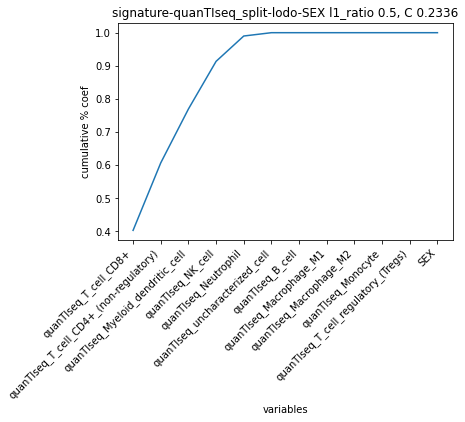

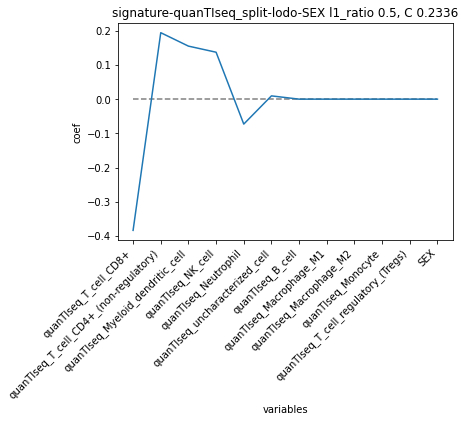

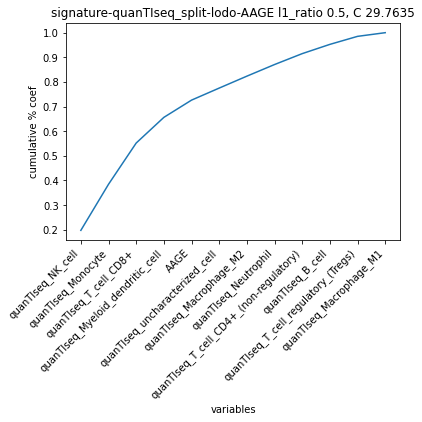

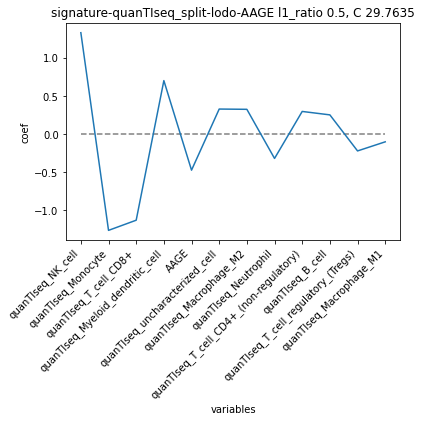

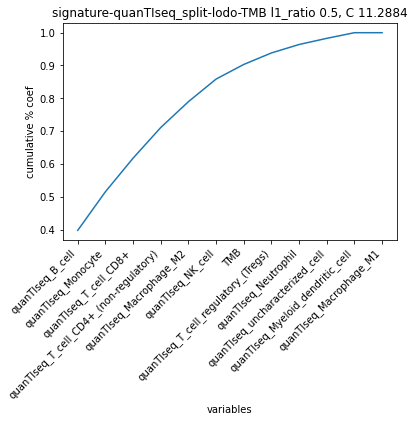

...

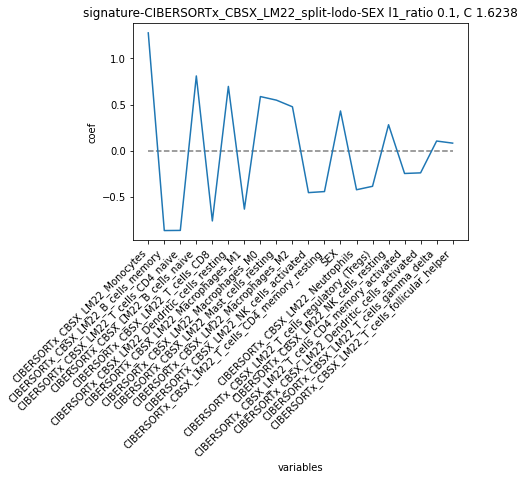

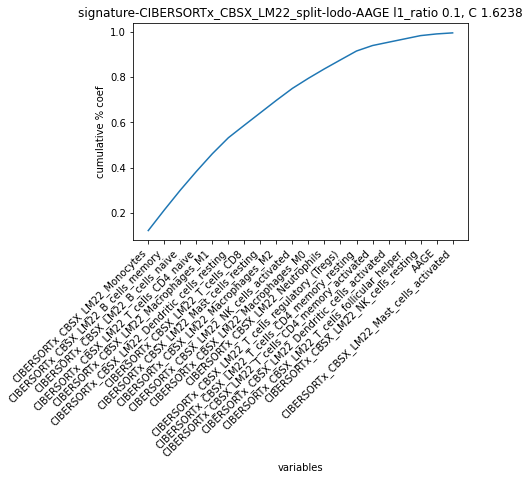

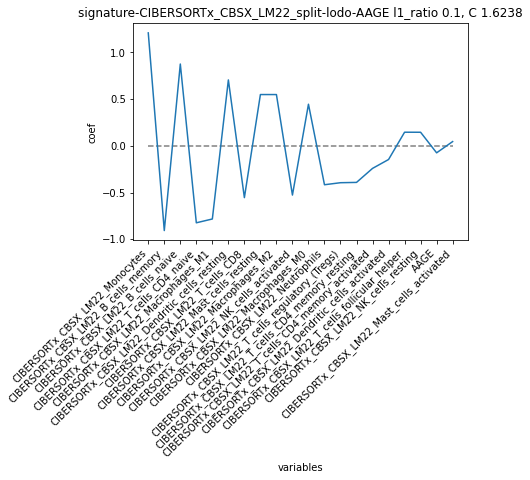

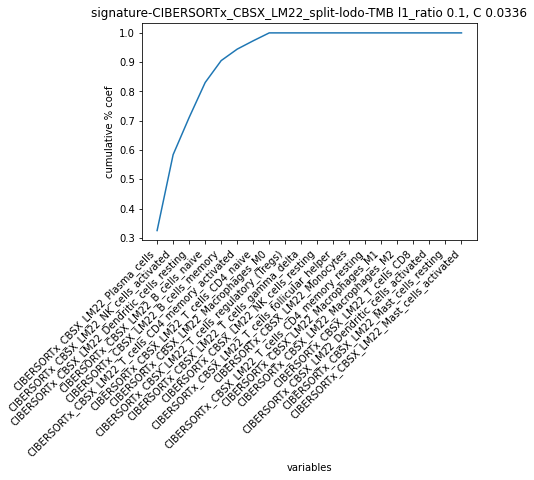

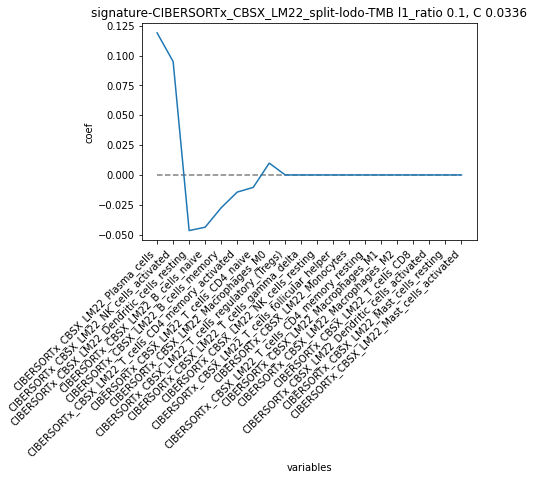

In [3]:
score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
start = time()

for l1_name, l1_ratios in l1_ratios_list:
    dir_save = dir_save_orig / "joint_clinical_deconv_diff" / f'l1_ratios-{l1_name}'
    dir_save.mkdir(parents=True, exist_ok=True)
    log_file = open(dir_save / "training_logs.txt","a")

    score_condi = {}
    for condi in conditions:
        write_log(log_file, f"Training using {condi}")
        var_idx = [x for x in df_all.columns if x.startswith(condi)]
        str_condi = condi.strip('_')
        
        score_split = {}
        # LODO splitting
        for clin_col in ["SEX", "AAGE", "TMB"]: #for test_name in datasets:
            
            # ================== with clinical data ==================
            test_name = clin_col
            write_log(log_file, f"    LODO training using {clin_col} as clinical variable")
            # select samples that have records in clinical variable and deconv data
            valid_ids = list(set(clin.index[~clin.loc[:, clin_col].isna()]).intersection(set(df_all.index)))
            # merge clinical data to deconv variables
            add_clin = clin.loc[valid_ids, clin_col].copy()
            if clin_col == "SEX":
                add_clin = add_clin.map({'M': 0, 'F': 1})
            X = df_all.loc[valid_ids, var_idx].join(add_clin).values
            y = response['BOR - binary'].loc[valid_ids].values
            # reverse labels to match "equaling progressive disease" objective
            y = -(y-1)
            # stratify train / test by response
            np.random.seed(0)
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, 
                test_size=0.25, 
                random_state=0, 
                shuffle=True, 
            )
            # Standardize data to give same weight to regularization
            scaler = StandardScaler()
            X_train = scaler.fit_transform(X_train)
            X_test = scaler.transform(X_test)

            training_succeeded = False
            cv_used = CV_TRAIN
            while not training_succeeded and cv_used <= CV_MAX:
                np.random.seed(0)
                clf = linear_model.LogisticRegressionCV(
                    cv=cv_used,
                    Cs=20,  # number of tested values for inverse of regularization strength
                    penalty='elasticnet', 
                    # scoring='neg_log_loss', 
                    scoring='roc_auc', 
                    solver='saga', 
                    l1_ratios=l1_ratios,
                    max_iter=10000,
                    n_jobs=-1,  # or n_jobs-1 to leave one core available
                )
                clf = clf.fit(X_train, y_train)
                training_succeeded = not np.all(clf.coef_ == 0)
                if not training_succeeded:
                    if CV_ADAPT:
                        cv_used += 1
                        write_log(log_file, f"        training failed, trying with cv = {cv_used}")
                    else:
                        write_log(log_file, f"        training failed")
                        break
                
            if training_succeeded:
                y_pred_proba = clf.predict_proba(X_test)[:, 1]
                y_pred = clf.predict(X_test)
                score = {
                    'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
                    'AP' : metrics.average_precision_score(y_test, y_pred_proba),
                    'MCC': metrics.matthews_corrcoef(y_test, y_pred),
                }
            else:
                score = {
                    'ROC AUC': np.nan,
                    'AP' : np.nan,
                    'MCC': np.nan,
                }
                write_log(log_file, f"        training failed with cv <= {CV_MAX}")
            for metric in score_labels:
                score_split[test_name + ' - ' + metric] = score[metric]
                write_log(log_file, f"        {metric} {test_name}: {score[metric]}")
            
            # Save model coefficients and plots
            param_string = f"signature-{str_condi}_split-lodo-{clin_col}"
            l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
            C = np.round(clf.C_[0], decimals=4)
            
            if training_succeeded:
                coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx + [clin_col])
                coef['abs coef'] = coef['coef'].abs()
                coef = coef.sort_values(by='abs coef', ascending=False)
                coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
                coef['cum % total'] = coef['% total'].cumsum()
                coef['coef OR'] = np.exp(coef['coef'])
                coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients_{param_string}.csv")
                nb_coef = coef.shape[0]
                
                # add proportion of absolute coefficient of clinical feature
                coef_prop = coef.loc[clin_col, '% total']
                coef_prop_name = test_name + ' - ' + 'coef prop'
                score_split[coef_prop_name] = coef_prop

                nb_coef_plot = min(20, nb_coef)
                labels = coef.index[:nb_coef_plot]
                plt.figure()
                ax = coef.loc[labels, 'cum % total'].plot()
                ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
                # ticks_label = np.round(ticks_label, decimals=2)
                ax.set_xticks(ticks_pos)
                # ax.set_xticklabels(ticks_label)
                ax.set_xticklabels(labels, rotation=45, ha='right')
                plt.xlabel('variables')
                plt.ylabel('cumulative % coef')
                plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
                plt.savefig(dir_save / f"cumulative_abs_coef_{param_string}.png", bbox_inches='tight', facecolor='white')

                plt.figure()
                ax = coef.loc[labels, 'coef'].plot()
                ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
                ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
                # ticks_label = np.round(ticks_label, decimals=2)
                ax.set_xticks(ticks_pos)
                # ax.set_xticklabels(ticks_label)
                ax.set_xticklabels(labels, rotation=45, ha='right')
                plt.xlabel('variables')
                plt.ylabel('coef')
                plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
                plt.savefig(dir_save / f"coef_{param_string}.png", bbox_inches='tight', facecolor='white')

            
            
            # ================== without clinical data ==================
            test_name = clin_col + ' deconv only'
            write_log(log_file, f"    LODO training using deconvolution data only")
            # we use the same samples that have both clinical data and deconv data
            # here we don't merge clinical data to deconv variables
            # X = df_all.loc[valid_ids, var_idx].join(add_clin).values
            X = df_all.loc[valid_ids, var_idx].values
            y = response['BOR - binary'].loc[valid_ids].values
            # reverse labels to match "equaling progressive disease" objective
            y = -(y-1)
            # stratify train / test by response
            np.random.seed(0)
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, 
                test_size=0.25, 
                random_state=0, 
                shuffle=True, 
            )
            # Standardize data to give same weight to regularization
            scaler = StandardScaler()
            X_train = scaler.fit_transform(X_train)
            X_test = scaler.transform(X_test)

            training_succeeded = False
            cv_used = CV_TRAIN
            while not training_succeeded and cv_used <= CV_MAX:
                np.random.seed(0)
                clf = linear_model.LogisticRegressionCV(
                    cv=cv_used,
                    Cs=20, 
                    penalty='elasticnet', 
                    # scoring='neg_log_loss', 
                    scoring='roc_auc', 
                    solver='saga', 
                    l1_ratios=l1_ratios,
                    max_iter=10000,
                    n_jobs=-1,  # or n_jobs-1 to leave one core available
                )
                clf = clf.fit(X_train, y_train)
                training_succeeded = not np.all(clf.coef_ == 0)
                if not training_succeeded:
                    if CV_ADAPT:
                        cv_used += 1
                        write_log(log_file, f"        training failed, trying with cv = {cv_used}")
                    else:
                        write_log(log_file, f"        training failed")
                        break
                
            if training_succeeded:
                y_pred_proba = clf.predict_proba(X_test)[:, 1]
                y_pred = clf.predict(X_test)
                score = {
                    'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
                    'AP' : metrics.average_precision_score(y_test, y_pred_proba),
                    'MCC': metrics.matthews_corrcoef(y_test, y_pred),
                }
            else:
                score = {
                    'ROC AUC': np.nan,
                    'AP' : np.nan,
                    'MCC': np.nan,
                }
                write_log(log_file, f"        training failed with cv <= {CV_MAX}")
            for metric in score_labels:
                score_split[test_name + ' - ' + metric] = score[metric]
                write_log(log_file, f"        {metric} {test_name}: {score[metric]}")
                # add score difference with minus without clinical data
                score_split[clin_col + ' - diff ' + metric] = score_split[clin_col + ' - ' + metric] - score_split[test_name + ' - ' + metric]
                
        score_condi[str_condi] = score_split
        plot_figure(plt, PLOT_MODE)

    scores = pd.DataFrame.from_dict(score_condi, orient='index')
    scores.index.name = 'signature'
    # reorder columns to group by evaluation metric
    col_order = []
    for metric in score_labels:
        new_col = [x for x in scores.columns if x.endswith(metric)]
        col_order.extend(new_col)
    # to put absolute clinical coefficient at the beginning of the dataframe
    coef_prop_cols = [x for x in scores.columns if x.endswith('coef prop')]
    col_order = coef_prop_cols + col_order
    scores = scores[col_order]
    scores.to_csv(dir_save / 'scores_signatures_deconv_clinic.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
write_log(log_file, f"Training took {duration}s")
log_file.close()

# %% [markdown] tags=[]
# ### Added predictive value of clinical data

# %% [markdown]
# We compare performance of models with / without clinical data, and the relative importance of clinical data in corresponding models.

# %%
from adjustText import adjust_text

score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]
clin_cols = ["SEX", "AAGE", "TMB"]

# for l1_name, l1_ratios in l1_ratios_list:
l1_name, l1_ratios = l1_ratios_list[-1]
print("l1 ratios:", l1_name)
dir_load = dir_save_orig / "joint_clinical_deconv_diff" / f'l1_ratios-{l1_name}'
df = pd.read_csv(dir_load / "scores_signatures_deconv_clinic.csv", index_col=0)

# for score_label in score_labels: 
# score_label = 'ROC AUC'
for score_label in score_labels:
    for clin_col in clin_cols:
        x_col = clin_col + ' - diff ' + score_label
        y_col = clin_col + ' - coef prop'
        base_score_col = clin_col + ' - ' + score_label
        df_plot = df[[x_col, y_col, base_score_col]]
        df_plot = df_plot.dropna(axis=0)
        labels = df_plot.index

        fig, ax = plt.subplots(figsize=(8, 6))
        x = df_plot.iloc[:, 0].values
        y = df_plot.iloc[:, 1].values * 100
        score = df_plot.iloc[:, 2]

        ax.axvline(x=0, ymin=y.min()-5, ymax=y.max()+5, c='orangered', linestyle='--', linewidth=1)
        mappable = ax.scatter(x, y, c=score, cmap='coolwarm_r')
        plt.colorbar(mappable=mappable, ax=ax)
        ax.set_xlabel(f'Gain in {score_label}')
        ax.set_ylabel(f'% weight of {clin_col}')
        ax.set_xlim([x.min()-0.1, x.max()+0.1])
        ax.set_ylim([y.min()-5, y.max()+5])
        texts = [plt.text(x[i], y[i], label, ha='center', va='center') for i, label in enumerate(labels)]
        adjust_text(texts, arrowprops=dict(arrowstyle='->', color='blue'))
        title = f"Gain in predictive power by {score_label} and feature importance of {clin_col}"
        ax.set_title(title)
        fig.savefig(dir_load / title, facecolor='white')
        plot_figure(fig, PLOT_MODE)

# %% [markdown] tags=[]
# ### Cell types proportions

# %%
y = response['BOR - binary'].values
# reverse labels to match "equaling progressive disease" objective
y = -(y-1)

# %%
from scipy import stats

rhos = []
pvals = []
for col in df_all.columns:
    rho, pval = stats.spearmanr(df_all[col], y)
    rhos.append(rho)
    pvals.append(pval)

# %%
from statsmodels.stats.multitest import fdrcorrection

df_corr = pd.DataFrame({'rho':rhos, 'pval': pvals}, index=df_all.columns)
df_corr['abs rho'] = df_corr['rho'].abs()
for condi in conditions:
    var_idx = [x for x in df_corr.index if x.startswith(condi)]    
    rejected, pval_corr = fdrcorrection(df_corr.loc[var_idx, 'pval'], method='indep')
    df_corr.loc[var_idx, 'pval_corr'] = pval_corr
df_corr.sort_values(by=['abs rho'], ascending=False, inplace=True)

# %%
df_corr.loc[df_corr['pval'] <= 0.05]

# %%
df_corr.loc[df_corr['pval_corr'] <= 0.05]

# %%
counts = []
for condi in conditions:
    var_idx = [x for x in df_all.columns if x.startswith(condi)]
    counts.append(len(var_idx))
sig_counts = pd.DataFrame({'# cell types': counts}, index=conditions)
sig_counts.index.name = 'conditions'
sig_counts

# %% [markdown]
# There are many XCELL deconvolution variables in the list of cell types whose proportions are statistically (anti-)correlated with response, but XCEL outputs between 5-10 times more variables than other deconvolution methods.

# %% [markdown]
# # Train and test on deconvolution data

# %%

# LP

Training using quanTIseq
    LODO training using Gide as test set
        training failed
        training failed with cv <= 10
        ROC AUC Gide: nan
        AP Gide: nan
        MCC Gide: nan
    LODO training using Hugo as test set
        ROC AUC Hugo: 0.4666666666666667
        AP Hugo: 0.465520683020683
        MCC Hugo: 0.0
    LODO training using Riaz as test set
        training failed
        training failed with cv <= 10
        ROC AUC Riaz: nan
        AP Riaz: nan
        MCC Riaz: nan
    CV training on all datasets
        ROC AUC CV all datasets: 0.41538461538461535
        AP CV all datasets: 0.4955147750799924
        MCC CV all datasets: 0.24308621740219885
    testing on LP dataset
Score: 0.5333333333333333
Coefficient
                                        Coefficients
quanTIseq_T_cell_CD4+_(non-regulatory)      0.138353
quanTIseq_B_cell                            0.000000
quanTIseq_Macrophage_M1                     0.000000
quanTIseq_Macrophage_M2            

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


    CV training on all datasets
        training failed
        training failed with cv <= 10
        ROC AUC CV all datasets: nan
        AP CV all datasets: nan
        MCC CV all datasets: nan
        training failed with cv <= 10
        ROC AUC CV all datasets test LP: nan
        AP CV all datasets test LP: nan
        MCC CV all datasets test LP: nan
Training using DeconRNASeq_CBSX_LM22_
    LODO training using Gide as test set
        ROC AUC Gide: 0.505
        AP Gide: 0.4095865320180516
        MCC Gide: -0.061871843353822904
    LODO training using Hugo as test set
        ROC AUC Hugo: 0.19999999999999998
        AP Hugo: 0.32164679535203833
        MCC Hugo: -0.4
    LODO training using Riaz as test set
        ROC AUC Riaz: 0.4772727272727273
        AP Riaz: 0.5038456870500214
        MCC Riaz: -0.12336594280495668
    CV training on all datasets
        ROC AUC CV all datasets: 0.5538461538461538
        AP CV all datasets: 0.5906938230851273
        MCC CV all dataset

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


    testing on LP dataset
Score: 0.6
Coefficient
                                        Coefficients
quanTIseq_T_cell_CD4+_(non-regulatory)      0.128226
quanTIseq_Myeloid_dendritic_cell            0.028262
quanTIseq_B_cell                           -0.016485
quanTIseq_NK_cell                           0.011192
quanTIseq_Macrophage_M1                     0.000000
quanTIseq_Macrophage_M2                     0.000000
quanTIseq_Monocyte                          0.000000
quanTIseq_Neutrophil                        0.000000
quanTIseq_T_cell_CD8+                       0.000000
quanTIseq_T_cell_regulatory_(Tregs)         0.000000
quanTIseq_uncharacterized_cell              0.000000
        ROC AUC CV all datasets test LP: 0.6
        AP CV all datasets test LP: 0.6428571428571428
        MCC CV all datasets test LP: 0.0
Training using MCP
    LODO training using Gide as test set
        ROC AUC Gide: 0.6074999999999999
        AP Gide: 0.5466904164029158
        MCC Gide: 0.18
    LODO train

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


    LODO training using Riaz as test set
        ROC AUC Riaz: 0.4696969696969697
        AP Riaz: 0.5854849542156044
        MCC Riaz: 0.24960095744714741
    CV training on all datasets
        training failed
        training failed with cv <= 10
        ROC AUC CV all datasets: nan
        AP CV all datasets: nan
        MCC CV all datasets: nan
        training failed with cv <= 10
        ROC AUC CV all datasets test LP: nan
        AP CV all datasets test LP: nan
        MCC CV all datasets test LP: nan
Training using DeconRNASeq_CBSX_LM22_
    LODO training using Gide as test set
        ROC AUC Gide: 0.51
        AP Gide: 0.4134706413297925
        MCC Gide: -0.061871843353822904
    LODO training using Hugo as test set
        ROC AUC Hugo: 0.3277777777777778
        AP Hugo: 0.42269185578783103
        MCC Hugo: 0.0
    LODO training using Riaz as test set
        ROC AUC Riaz: 0.48484848484848486
        AP Riaz: 0.5062823342235108
        MCC Riaz: -0.12336594280495668
   

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


    testing on LP dataset
Score: 0.6
Coefficient
                                        Coefficients
quanTIseq_T_cell_CD4+_(non-regulatory)      0.128237
quanTIseq_Myeloid_dendritic_cell            0.028227
quanTIseq_B_cell                           -0.016510
quanTIseq_NK_cell                           0.011193
quanTIseq_Macrophage_M1                     0.000000
quanTIseq_Macrophage_M2                     0.000000
quanTIseq_Monocyte                          0.000000
quanTIseq_Neutrophil                        0.000000
quanTIseq_T_cell_CD8+                       0.000000
quanTIseq_T_cell_regulatory_(Tregs)         0.000000
quanTIseq_uncharacterized_cell              0.000000
        ROC AUC CV all datasets test LP: 0.6
        AP CV all datasets test LP: 0.6428571428571428
        MCC CV all datasets test LP: 0.0
Training using MCP
    LODO training using Gide as test set
        ROC AUC Gide: 0.5974999999999999
        AP Gide: 0.5312446409496194
        MCC Gide: 0.18
    LODO train

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


    CV training on all datasets
        training failed
        training failed with cv <= 10
        ROC AUC CV all datasets: nan
        AP CV all datasets: nan
        MCC CV all datasets: nan
        training failed with cv <= 10
        ROC AUC CV all datasets test LP: nan
        AP CV all datasets test LP: nan
        MCC CV all datasets test LP: nan
Training using DeconRNASeq_CBSX_LM22_
    LODO training using Gide as test set
        ROC AUC Gide: 0.51
        AP Gide: 0.4134706413297925
        MCC Gide: -0.061871843353822904
    LODO training using Hugo as test set
        ROC AUC Hugo: 0.19444444444444442
        AP Hugo: 0.32004423124947423
        MCC Hugo: -0.4
    LODO training using Riaz as test set
        ROC AUC Riaz: 0.48484848484848486
        AP Riaz: 0.5062823342235108
        MCC Riaz: -0.12336594280495668
    CV training on all datasets
        ROC AUC CV all datasets: 0.5538461538461538
        AP CV all datasets: 0.5906938230851273
        MCC CV all dataset

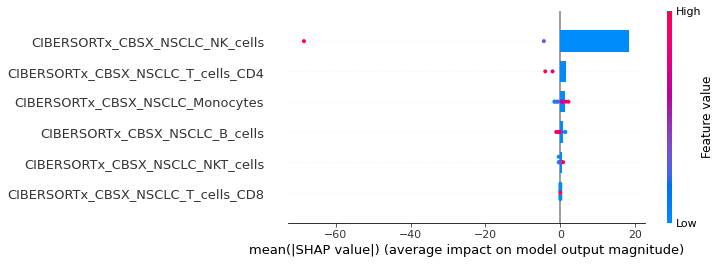

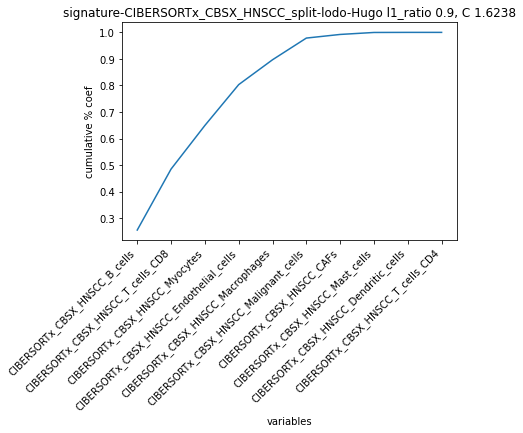

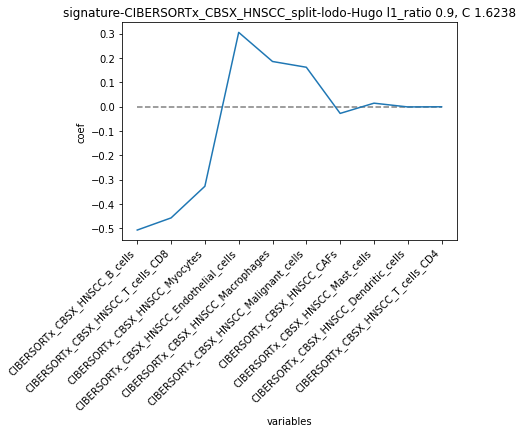

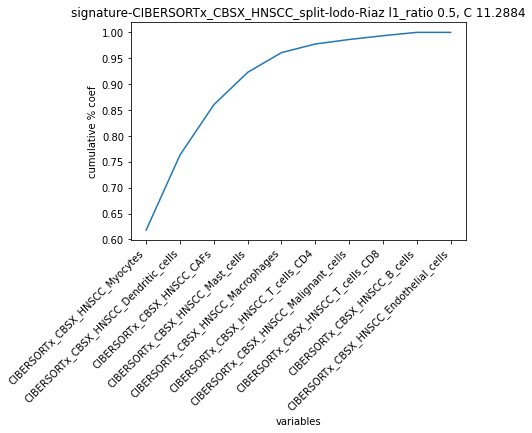

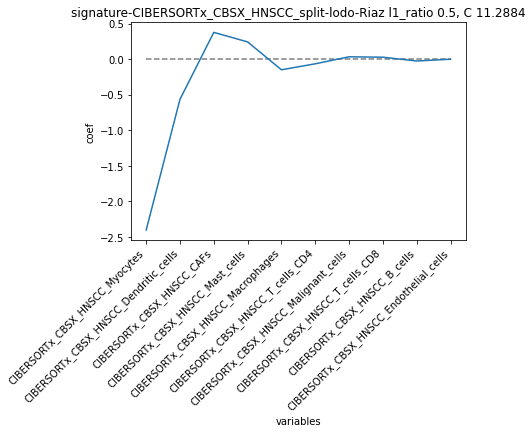

...

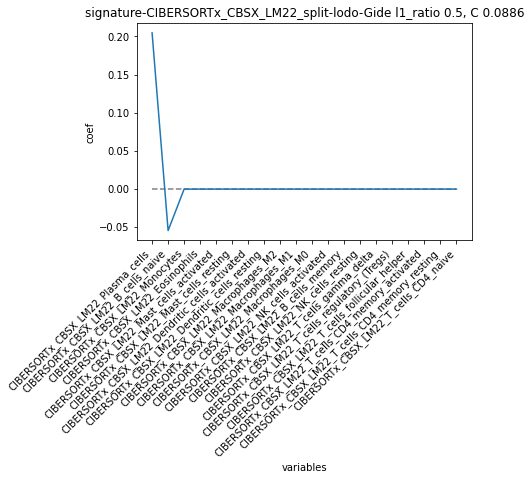

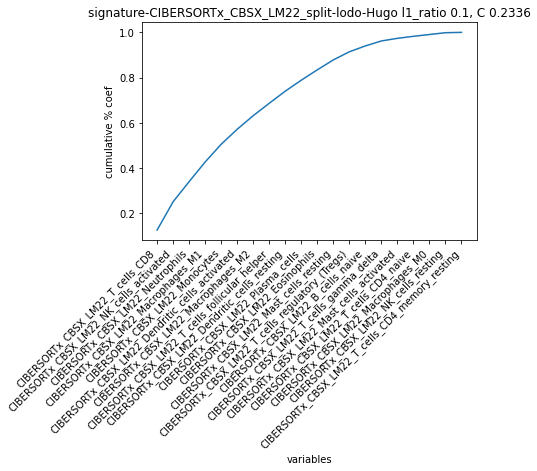

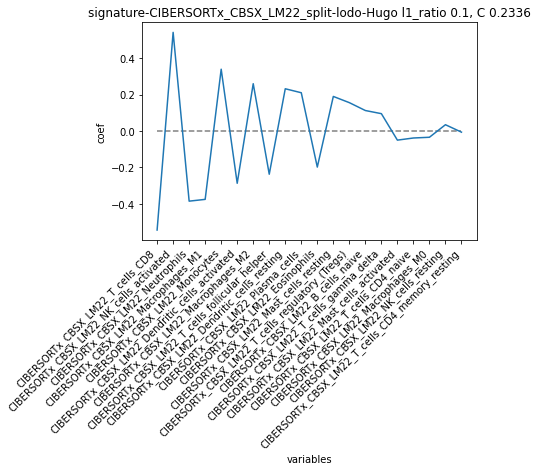

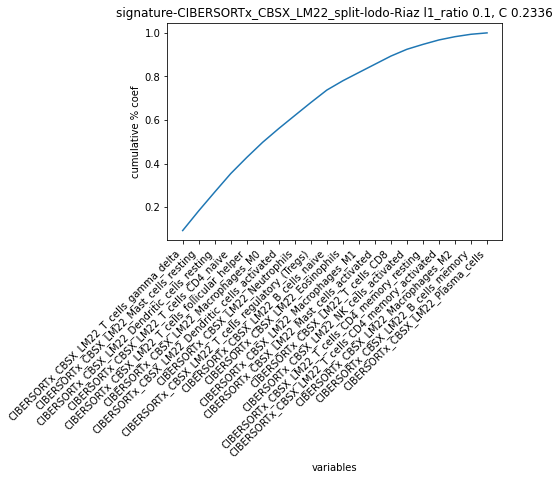

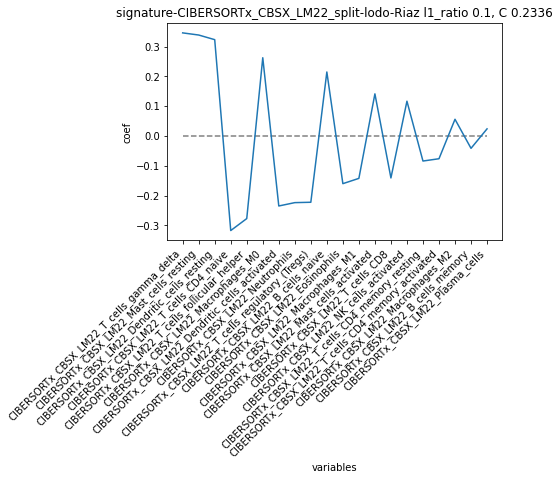

In [4]:
score_labels = [
    'ROC AUC', # Receiver Operating Characteristic Area Under the Curve
    'AP',      # Average Precision
    'MCC',     # Matthews Correlation Coefficient
]

start = time()

# l1_name, l1_ratios = l1_ratios_list[0]
for l1_name, l1_ratios in l1_ratios_list:
    dir_save = dir_save_orig / f'l1_ratios-{l1_name}'
    dir_save.mkdir(parents=True, exist_ok=True)
    log_file = open(dir_save / "training_logs.txt","a")

    score_condi = {}
    predict_scores = []
    coefficients_all_df = pd.DataFrame()
    # condi = conditions[0]
    for condi in conditions:
        write_log(log_file, f"Training using {condi}")
        var_idx = [x for x in df_all.columns if x.startswith(condi)]
        str_condi = condi.strip('_')
        
        score_split = {}
        # LODO splitting
        # test_name = datasets[0]
        for test_name in datasets:
            write_log(log_file, f"    LODO training using {test_name} as test set")
            test_ids = [x for x in df_all.index if test_name in x]
            train_ids = [x for x in df_all.index if test_name not in x]
            X_train = df_all.loc[train_ids, var_idx].values
            X_test= df_all.loc[test_ids, var_idx].values
            y_train = response['BOR - binary'].loc[train_ids].values
            y_test = response['BOR - binary'].loc[test_ids].values
            # reverse labels to match "equaling progressive disease" objective
            y_train = -(y_train-1)
            y_test = -(y_test-1)
            # Standardize data to give same weight to regularization
            # scaler = PowerTransformer(method='yeo-johnson')
            scaler = StandardScaler()
            X_train = scaler.fit_transform(X_train)
            X_test = scaler.transform(X_test)

            training_succeeded = False
            cv_used = CV_TRAIN
            while not training_succeeded and cv_used <= CV_MAX:
                np.random.seed(0)
                clf = linear_model.LogisticRegressionCV(
                    cv=cv_used,
                    Cs=20, 
                    penalty='elasticnet', 
                    # scoring='neg_log_loss', 
                    scoring='roc_auc', 
                    solver='saga', 
                    l1_ratios=l1_ratios,
                    max_iter=10000,
                    n_jobs=-1,  # or n_jobs-1 to leave one core available
                )
                clf = clf.fit(X_train, y_train)
                training_succeeded = not np.all(clf.coef_ == 0)
                if not training_succeeded:
                    if CV_ADAPT:
                        cv_used += 1
                        write_log(log_file, f"        training failed, trying with cv = {cv_used}")
                    else:
                        write_log(log_file, f"        training failed")
                        break
                
            if training_succeeded:
                y_pred_proba = clf.predict_proba(X_test)[:, 1]
                y_pred = clf.predict(X_test)
                score = {
                    'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
                    'AP' : metrics.average_precision_score(y_test, y_pred_proba),
                    'MCC': metrics.matthews_corrcoef(y_test, y_pred),
                }
            else:
                score = {
                    'ROC AUC': np.nan,
                    'AP' : np.nan,
                    'MCC': np.nan,
                }
                write_log(log_file, f"        training failed with cv <= {CV_MAX}")
            for metric in score_labels:
                score_split[test_name + ' - ' + metric] = score[metric]
                write_log(log_file, f"        {metric} {test_name}: {score[metric]}")

            # Save model coefficients and plots
            param_string = f"signature-{str_condi}_split-lodo-{test_name}"
            l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
            C = np.round(clf.C_[0], decimals=4)
            
            if training_succeeded:
                coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
                coef['abs coef'] = coef['coef'].abs()
                coef = coef.sort_values(by='abs coef', ascending=False)
                coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
                coef['cum % total'] = coef['% total'].cumsum()
                coef['coef OR'] = np.exp(coef['coef'])
                coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients_{param_string}.csv")
                nb_coef = coef.shape[0]
                
                nb_coef_plot = min(20, nb_coef)
                labels = coef.index[:nb_coef_plot]
                plt.figure()
                ax = coef.loc[labels, 'cum % total'].plot()
                ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
                # ticks_label = np.round(ticks_label, decimals=2)
                ax.set_xticks(ticks_pos)
                # ax.set_xticklabels(ticks_label)
                ax.set_xticklabels(labels, rotation=45, ha='right')
                plt.xlabel('variables')
                plt.ylabel('cumulative % coef')
                plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
                plt.savefig(dir_save / f"cumulative_abs_coef_{param_string}.png", bbox_inches='tight', facecolor='white')

                plt.figure()
                ax = coef.loc[labels, 'coef'].plot()
                ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
                ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
                # ticks_label = np.round(ticks_label, decimals=2)
                ax.set_xticks(ticks_pos)
                # ax.set_xticklabels(ticks_label)
                ax.set_xticklabels(labels, rotation=45, ha='right')
                plt.xlabel('variables')
                plt.ylabel('coef')
                plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
                plt.savefig(dir_save / f"coef_{param_string}.png", bbox_inches='tight', facecolor='white')


        # ------ All datasets with CV splitting ------
        write_log(log_file, "    CV training on all datasets")
        X = df_all.loc[:, var_idx].values
        y = response['BOR - binary'].values
        # stratify train / test by dataset and response
        np.random.seed(0)
        strat = response.apply(lambda x:x['dataset'] + '-' + str(x['BOR - binary']), axis=1)
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, 
            test_size=0.25, 
            random_state=0, 
            shuffle=True, 
            stratify=strat,
        )
        # reverse labels to match "equaling progressive disease" objective
        y_train = -(y_train-1)
        y_test = -(y_test-1)
        # Standardize data to give same weight to regularization
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        
        training_succeeded = False
        cv_used = CV_TRAIN
        while not training_succeeded and cv_used <= CV_MAX:
            np.random.seed(0)
            clf = linear_model.LogisticRegressionCV(
                cv=cv_used,
                Cs=20, 
                penalty='elasticnet', 
                # scoring='neg_log_loss', 
                scoring='roc_auc', 
                solver='saga', 
                l1_ratios=l1_ratios,
                max_iter=10000,
                n_jobs=-1,  # or n_jobs-1 to leave one core available
            )
            clf = clf.fit(X_train, y_train)
            training_succeeded = not np.all(clf.coef_ == 0)
            if not training_succeeded:
                if CV_ADAPT:
                    cv_used += 1
                    write_log(log_file, f"        training failed, trying with cv = {cv_used}")
                else:
                    write_log(log_file, f"        training failed")
                    break

        training_succeeded = not np.all(clf.coef_ == 0)

        if training_succeeded:
            y_pred_proba = clf.predict_proba(X_test)[:, 1]
            y_pred = clf.predict(X_test)
            score = {
                'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
                'AP' : metrics.average_precision_score(y_test, y_pred_proba),
                'MCC': metrics.matthews_corrcoef(y_test, y_pred),
            }
        else:
            score = {
                'ROC AUC': np.nan,
                'AP' : np.nan,
                'MCC': np.nan,
            }
            write_log(log_file, f"        training failed with cv <= {CV_MAX}")
        for metric in score_labels:
            test_name = 'CV all datasets'
            score_split[test_name + ' - ' + metric] = score[metric]
            write_log(log_file, f"        {metric} {test_name}: {score[metric]}")

        # save all scores for the given 'method x signature' condition
        score_condi[str_condi] = score_split

        # Save model coefficients and plots
        param_string = f"signature-{str_condi}_split-CV-5folds"
        l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
        C = np.round(clf.C_[0], decimals=4)
        
        if training_succeeded:
            coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
            coef['abs coef'] = coef['coef'].abs()
            coef = coef.sort_values(by='abs coef', ascending=False)
            coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
            coef['cum % total'] = coef['% total'].cumsum()
            coef['coef OR'] = np.exp(coef['coef'])
            coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients_{param_string}.csv")
            nb_coef = coef.shape[0]
        
            nb_coef_plot = min(20, nb_coef)
            labels = coef.index[:nb_coef_plot]
            plt.figure()
            ax = coef.loc[labels, 'cum % total'].plot()
            ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
            # ticks_label = np.round(ticks_label, decimals=2)
            ax.set_xticks(ticks_pos)
            # ax.set_xticklabels(ticks_label)
            ax.set_xticklabels(labels, rotation=45, ha='right')
            plt.xlabel('variables')
            plt.ylabel('cumulative % coef')
            plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
            plt.savefig(dir_save / f"cumulative_abs_coef_{param_string}.png", bbox_inches='tight', facecolor='white')

            plt.figure()
            ax = coef.loc[labels, 'coef'].plot()
            ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
            ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
            # ticks_label = np.round(ticks_label, decimals=2)
            ax.set_xticks(ticks_pos)
            # ax.set_xticklabels(ticks_label)
            ax.set_xticklabels(labels, rotation=45, ha='right')
            plt.xlabel('variables')
            plt.ylabel('coef')
            plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
            plt.savefig(dir_save / f"coef_{param_string}.png", bbox_inches='tight', facecolor='white')

            plot_figure(plt, PLOT_MODE)
            plt.close('all')
        
        if TEST_CLOUG:
            # ------ All datasets with CV splitting ------
            if training_succeeded:
                write_log(log_file, f"    testing on Cloughesy dataset")
                X_test = deconv_cloug.loc[:, var_idx].values
                y_test = response_cloug['BOR - binary'].values
                # reverse labels to match "equaling progressive disease" objective
                y_test = -(y_test-1)
                # Standardize data to give same weight to regularization
                X_test = scaler.transform(X_test)

                y_pred_proba = clf.predict_proba(X_test)[:, 1]
                y_pred = clf.predict(X_test)
                score = {
                    'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
                    'AP' : metrics.average_precision_score(y_test, y_pred_proba),
                    'MCC': metrics.matthews_corrcoef(y_test, y_pred),
                }
            else:
                score = {
                    'ROC AUC': np.nan,
                    'AP' : np.nan,
                    'MCC': np.nan,
                }
                write_log(log_file, f"        training failed with cv <= {CV_MAX}")
            test_name = 'CV all datasets test Cloughesy'
            for metric in score_labels:
                score_split[test_name + ' - ' + metric] = score[metric]
                write_log(log_file, f"        {metric} {test_name}: {score[metric]}")
            score_condi[str_condi] = score_split

        if TEST_LP:
            # ------ All datasets with CV splitting ------
            if training_succeeded:
                write_log(log_file, f"    testing on LP dataset")
                X_test = deconv_lp.loc[:, var_idx].values
                y_test = response_lp['Progression_6_months'].values
                # reverse labels to match "equaling progressive disease" objective
                y_test = -(y_test-1)
                # Standardize data to give same weight to regularization
                X_test = scaler.transform(X_test)

                y_pred_proba = clf.predict_proba(X_test)[:, 1]
                y_pred = clf.predict(X_test)

                score =clf.score(X_test, y_test)
                print(f"Score: {score}")
                predict_scores.append({"signature": str_condi, "score": score})

                coefs = pd.DataFrame(
                    clf.coef_,
                    columns=deconv_lp.loc[:, var_idx].columns,
                    index = ["Coefficients"]
                ).T.sort_values(by ="Coefficients", ascending=False, key=abs)
                print("Coefficient")
                print(coefs)
                coefs.to_csv(dir_save/f"LP_coefficients_{str_condi}.csv")
                coefficients_all_df = coefficients_all_df.append(coefs)

                X_test = pd.DataFrame(scaler.transform(X_test))
                X_test.columns = deconv_lp.loc[:, var_idx].columns
                explainer = shap.Explainer(clf, X_test)
                shap_values = explainer(X_test)
                shap.summary_plot(shap_values, X_test, show = False)
                plt.savefig(dir_save/f"LP_shap_values_{str_condi}.svg", bbox_inches='tight')
                shap.summary_plot(shap_values, X_test, plot_type = "bar", show = False)
                plt.savefig(dir_save/f"LP_shap_values_bar_{str_condi}.svg", bbox_inches='tight')

                score = {
                    'ROC AUC': metrics.roc_auc_score(y_test, y_pred_proba),
                    'AP' : metrics.average_precision_score(y_test, y_pred_proba),
                    'MCC': metrics.matthews_corrcoef(y_test, y_pred),
                }
            else:
                score = {
                    'ROC AUC': np.nan,
                    'AP' : np.nan,
                    'MCC': np.nan,
                }
                write_log(log_file, f"        training failed with cv <= {CV_MAX}")
            test_name = 'CV all datasets test LP'
            for metric in score_labels:
                score_split[test_name + ' - ' + metric] = score[metric]
                write_log(log_file, f"        {metric} {test_name}: {score[metric]}")
            score_condi[str_condi] = score_split
            

    predict_scores_df = pd.DataFrame(predict_scores).sort_values(by='score', ascending=False)
    predict_scores_df.to_csv(dir_save / 'LP_predict_scores.csv', index = False)
    coefficients_all_df.to_csv(dir_save / 'LP_all_coefficients.csv')

    scores = pd.DataFrame.from_dict(score_condi, orient='index')
    scores.index.name = 'signature'
    # reorder columns to group by evaluation metric
    col_order = []
    for metric in score_labels:
        new_col = [x for x in scores.columns if x.endswith(metric)]
        col_order.extend(new_col)
    scores = scores[col_order]
    scores.to_csv(dir_save / 'scores_signatures_deconv.csv')

end = time()
duration = end - start
print("\n"*5)
print("-------------------------------------------")
print("------------------- END -------------------")
print("-------------------------------------------")
write_log(log_file, f"Training took {duration}s")
log_file.close()



In [ ]:
# %% [markdown]
# ## Test individual training conditions

# %%
# Run training for a particular set of parameters

l1_name, l1_ratios = l1_ratios_list[-1]
condi = conditions[-1]
test_name = datasets[-1]

print("l1 ratios:", l1_name)
print('condition:', condi)
print("test dataset:", test_name)

# %%
score_condi = {}
# ------------------------
print(f"Training using {condi}")
var_idx = [x for x in df_all.columns if x.startswith(condi)]
str_condi = condi.strip('_')

score_split = {}
# ------------------------
# LODO splitting
print(f"    LODO training using {test_name} as test set")
test_ids = [x for x in df_all.index if test_name in x]
train_ids = [x for x in df_all.index if test_name not in x]
X_train = df_all.loc[train_ids, var_idx].values
X_test= df_all.loc[test_ids, var_idx].values
y_train = response['BOR - binary'].loc[train_ids].values
y_test = response['BOR - binary'].loc[test_ids].values
# reverse labels to match "equaling progressive disease" objective
y_train = -(y_train-1)
y_test = -(y_test-1)
# Standardize data to give same weight to regularization
# scaler = PowerTransformer(method='yeo-johnson')
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

np.random.seed(0)
clf = linear_model.LogisticRegressionCV(
    cv=5,
    Cs=20, 
    penalty='elasticnet', 
    # scoring='neg_log_loss', 
    scoring='roc_auc', 
    solver='saga', 
    l1_ratios=l1_ratios,
    max_iter=10000,
    random_state=0,
    n_jobs=-1,  # or n_jobs-1 to leave one core available
)
clf = clf.fit(X_train, y_train)

training_succeeded = not np.all(clf.coef_ == 0)
if training_succeeded:
    y_pred = clf.predict_proba(X_test)[:, 1]
    score = metrics.roc_auc_score(y_test, y_pred)
else:
    score = np.nan
score_split[test_name] = score
print(f"         ROC AUC {test_name}: {score}")

# Save model coefficients and plots
param_string = f"signature-{str_condi}_split-lodo-{test_name}"
l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
C = np.round(clf.C_[0], decimals=4)

if training_succeeded:
    coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
    coef['abs coef'] = coef['coef'].abs()
    coef = coef.sort_values(by='abs coef', ascending=False)
    coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
    coef['cum % total'] = coef['% total'].cumsum()
    coef['coef OR'] = np.exp(coef['coef'])
    # coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients_{param_string}.csv")
    nb_coef = coef.shape[0]

    nb_coef_plot = min(20, nb_coef)
    labels = coef.index[:nb_coef_plot]
    plt.figure()
    ax = coef.loc[labels, 'cum % total'].plot()
    ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
    # ticks_label = np.round(ticks_label, decimals=2)
    ax.set_xticks(ticks_pos)
    # ax.set_xticklabels(ticks_label)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    plt.xlabel('variables')
    plt.ylabel('cumulative % coef')
    plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
    # plt.savefig(dir_save / f"cumulative_abs_coef_{param_string}.png", bbox_inches='tight', facecolor='white')

    plt.figure()
    ax = coef.loc[labels, 'coef'].plot()
    ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
    ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
    # ticks_label = np.round(ticks_label, decimals=2)
    ax.set_xticks(ticks_pos)
    # ax.set_xticklabels(ticks_label)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    plt.xlabel('variables')
    plt.ylabel('coef')
    plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
    # plt.savefig(dir_save / f"coef_{param_string}.png", bbox_inches='tight', facecolor='white')

# %%
clf.coefs_paths_[1].shape
# k-cv, Cs, ?, ?
# clf.__dir__()

# %%
# ------ All datasets with CV splitting ------
print(f"    CV training on all datasets")
X = df_all.loc[:, var_idx].values
y = response['BOR - binary'].values
# stratify train / test by dataset and response
np.random.seed(0)
strat = response.apply(lambda x:x['dataset'] + '-' + str(x['BOR - binary']), axis=1)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.25, 
    random_state=0, 
    shuffle=True, 
    stratify=strat,
)
# reverse labels to match "equaling progressive disease" objective
y_train = -(y_train-1)
y_test = -(y_test-1)
# Standardize data to give same weight to regularization
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

clf = linear_model.LogisticRegressionCV(
    Cs=20, 
    penalty='elasticnet', 
    # scoring='neg_log_loss', 
    scoring='roc_auc', 
    solver='saga', 
    l1_ratios=l1_ratios,
    max_iter=10000,
    n_jobs=-1,  # or n_jobs-1 to leave one core available
)
clf = clf.fit(X_train, y_train)

y_pred = clf.predict_proba(X_test)[:, 1]
score = metrics.roc_auc_score(y_test, y_pred)
score_split['CV_all_datasets'] = score
print(f"         ROC AUC CV all datasets: {score}")
score_condi[str_condi] = score_split

# Save model coefficients and plots
param_string = f"signature-{str_condi}_split-CV-5folds"
l1_ratio = np.round(clf.l1_ratio_[0], decimals=4)
C = np.round(clf.C_[0], decimals=4)

coef = pd.DataFrame({'coef': clf.coef_.flatten()}, index=var_idx)
coef['abs coef'] = coef['coef'].abs()
coef = coef.sort_values(by='abs coef', ascending=False)
coef['% total'] = coef['abs coef'] / coef['abs coef'].sum()
coef['cum % total'] = coef['% total'].cumsum()
coef['coef OR'] = np.exp(coef['coef'])
# coef.to_csv(dir_save / f"LogisticRegressionCV_coefficients_{param_string}.csv")
nb_coef = coef.shape[0]

nb_coef_plot = min(20, nb_coef)
labels = coef.index[:nb_coef_plot]
plt.figure()
ax = coef.loc[labels, 'cum % total'].plot()
ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
# ticks_label = np.round(ticks_label, decimals=2)
ax.set_xticks(ticks_pos)
# ax.set_xticklabels(ticks_label)
ax.set_xticklabels(labels, rotation=45, ha='right')
plt.xlabel('variables')
plt.ylabel('cumulative % coef')
plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
# plt.savefig(dir_save / f"cumulative_abs_coef_{param_string}.png", bbox_inches='tight', facecolor='white')

plt.figure()
ax = coef.loc[labels, 'coef'].plot()
ax.hlines(y=0, xmin=0, xmax=nb_coef_plot-1, colors='gray', linestyles='dashed')
ticks_pos = np.linspace(start=0, stop=nb_coef_plot-1, num=nb_coef_plot)
# ticks_label = np.round(ticks_label, decimals=2)
ax.set_xticks(ticks_pos)
# ax.set_xticklabels(ticks_label)
ax.set_xticklabels(labels, rotation=45, ha='right')
plt.xlabel('variables')
plt.ylabel('coef')
plt.title(param_string + f" l1_ratio {l1_ratio}, C {C}")
# plt.savefig(dir_save / f"coef_{param_string}.png", bbox_inches='tight', facecolor='white')

plot_figure(plt, PLOT_MODE)
plt.close('all')

if TEST_CLOUG:
    # ------ All datasets with CV splitting ------
    print(f"    CV training on all datasets")
    X_test = deconv_cloug.loc[:, var_idx].values
    y_test = response_cloug['BOR - binary'].values
    # reverse labels to match "equaling progressive disease" objective
    y_test = -(y_test-1)
    # Standardize data to give same weight to regularization
    X_test = scaler.transform(X_test)

    y_pred = clf.predict_proba(X_test)[:, 1]
    score_cloug = metrics.roc_auc_score(y_test, y_pred)

if TEST_LP:
    # ------ All datasets with CV splitting ------
    print(f"    CV training on all datasets")
    X_test = deconv_lp.loc[:, var_idx].values
    y_test = response_lp['Progression_6_months'].values
    # reverse labels to match "equaling progressive disease" objective
    y_test = -(y_test-1)
    # Standardize data to give same weight to regularization
    X_test = scaler.transform(X_test)

    y_pred = clf.predict_proba(X_test)[:, 1]
    score_lp = metrics.roc_auc_score(y_test, y_pred)

    pprint.pprint(score_lp)

# %% [markdown]
# ## Cell types proportions predicted by each signature

# %%
# from https://stackoverflow.com/questions/45664519/export-pandas-styled-table-to-image-file
# install https://wkhtmltopdf.org/ 
# and  https://github.com/jarrekk/imgkit

import imgkit

# dir_save = dir_save_orig / f'cell_proportions'
dir_save = Path(f"../../data/processed/Deconvolution_paper/Deconvolution_paper_revision/all_signatures_old/no_bladder/drop_scores/cell_types_proportions")
dir_save.mkdir(parents=True, exist_ok=True)
for condi in conditions:
    var_idx = [x for x in df_all.columns if condi in x]
    str_condi = condi.strip('_')
    prop = df_all.loc[:, var_idx].mean(axis=0).to_frame(name='all')
    # LODO splitting
    # test_name = datasets[0]
    for test_name in datasets:
        test_ids = [x for x in df_all.index if test_name in x]
        prop = prop.join(df_all.loc[test_ids, var_idx].mean(axis=0).to_frame(name=test_name))
    prop.to_csv(dir_save / f'proportions_signature-{str_condi}.csv')
    styled_table = prop.style.background_gradient(cmap='RdYlGn_r', axis=1)
    html = styled_table.render()
    imgkit.from_string(html, dir_save / f'proportions_signature-{str_condi}.png')

# %% [markdown]
# ## Comparison of cell types proportions predicted by each signature

# %%
from itertools import combinations

# condi1 = 'EpiDISH_BPRNACan3Dprom'
# condi2 = 'DeconRNASeq_BPRNACan'
condis = [
    'EpiDISH_BPRNACan3DProMet', 
    'DeconRNASeq_BPRNACan',
#     'CBSX_CIBERSORTx_ref_rna-seq', # not same cell types
]

for comb in combinations(condis, 2):
    condi1 = comb[0]
    condi2 = comb[1]
    
    prop1 = pd.read_csv(dir_save / f'proportions_signature-{condi1}.csv', index_col=0)[['all']]
    prop2 = pd.read_csv(dir_save / f'proportions_signature-{condi2}.csv', index_col=0)[['all']]

    new_index = [x.split('_')[-1] for x in prop1.index]
    prop1.index = new_index
    prop1.columns = [condi1]
    new_index = [x.split('_')[-1] for x in prop2.index]
    prop2.index = new_index
    prop2.columns = [condi2]

    prop = prop1.join(prop2)
    str_condi = '-'.join([condi1, condi2])
    prop.to_csv(dir_save / f'proportions_signature-{str_condi}.csv')
    styled_table = prop.style.background_gradient(cmap='RdYlGn_r', axis=1)
    html = styled_table.render()
    imgkit.from_string(html, dir_save / f'proportions_signature-{str_condi}.png')

# %% [markdown]
# ### Plot models coefficients and Odds Ratios

# %%
# coefs.index

# %%
dir_load = r"../data/processed/Deconvolution_paper_revision/data_version-all_deconvolutions_2021-11-02/only_melanoma/drop_scores/cv-5/l1_ratios-advised/"
dir_save = dir_load

signatures = [
    'EpiDISH_BPRNACan',
    'EpiDISH_BPRNACanProMet',
    'EpiDISH_BPRNACan3DProMet',
    'CIBERSORTx_CBSX_NSCLC',
]
signature = signatures[0]

for signature in signatures:

    patt = dir_load + "LogisticRegressionCV_coefficients_signature-"+signature+"_split-lodo-*.csv"
    coefs = []
    coefs_or = []
    for file_path in glob.glob(patt):
        model_coefs = pd.read_csv(file_path, index_col=0)
        new_index = [x.replace(signature+'_', '') for x in model_coefs.index]
        # new_index = [x.replace('BPRNACan3Dprom', 'BPRNACanProMet') for x in coef.index]
        # new_index = [x.replace('DeconRNA', 'DeconRNASeq') for x in coef.index]
        model_coefs.index = new_index
        if signature == 'CIBERSORTx_CBSX_NSCLC':
            remapper = {
                'T_cells_CD4': 'CD4', 
                'NK_cells': 'NK', 
                'Monocytes': 'Monocytes', 
                'NKT_cells': 'NKT', 
                'T_cells_CD8': 'CD8',
                'B_cells': 'B',
            }
            new_index = [remapper[x] for x in model_coefs.index]
            model_coefs.index = new_index
        model_coefs.index.name = 'cell type'
        data_name = re.search('-lodo-(.+?).csv', file_path).group(1)
        coef = model_coefs['coef']
        coef.name = data_name
        coefs.append(coef)
        coef_or = model_coefs['coef OR']
        coef_or.name = data_name
        coefs_or.append(coef_or)

    coefs = pd.concat(coefs, axis=1)
    coefs['mean abs'] = coefs.abs().mean(axis=1)
    coefs.sort_values(by='mean abs', ascending=False, inplace=True)
    coefs.drop(columns=['mean abs'], inplace=True)
    coefs = coefs.mean(axis=1)
    coefs = coefs.loc[coefs != 0]
    nb_coef = coefs.size

    coefs_or = pd.concat(coefs_or, axis=1)
    coefs_or['mean abs'] = coefs_or.abs().mean(axis=1)
    coefs_or.sort_values(by='mean abs', ascending=False, inplace=True)
    coefs_or.drop(columns=['mean abs'], inplace=True)
    coefs_or = coefs_or.mean(axis=1)
    coefs_or = coefs_or.loc[coefs_or != 0]
    nb_coef_or = coefs_or.size

    # Plot coefficients
    # create dataset
    y_pos = np.arange(nb_coef)[::-1]
    # Create horizontal bars
    plt.figure()
    plt.barh(y_pos, coefs)
    # Create names on the x-axis
    plt.yticks(y_pos, coefs.index)
    plt.vlines(x=0, ymin=-0.5, ymax=nb_coef-0.5, colors='gray', linestyles='dashed')

    plt.xlabel('coefficient')
    plt.ylabel('cell type')
    plt.title(signature.replace('_', ' '))
    plt.tight_layout()
    # plt.savefig(os.path.join(dir_save, "LogisticRegressionCV_coefficients_signature-"+signature+"_split-CV-5folds.png"), bbox_inches='tight', facecolor='white')
    maxi = coefs.abs().max() * 1.05
    plt.xlim([-maxi, maxi])
    plt.savefig(os.path.join(dir_save, "LogisticRegressionCV_coefficients_signature-"+signature+"_mean-lodo_centered.png"), bbox_inches='tight', facecolor='white')

    # Plot Odds Ratios
    # create dataset
    y_pos = np.arange(nb_coef_or)[::-1]
    # Create horizontal bars
    plt.figure()
    plt.barh(y_pos, coefs_or)
    # Create names on the x-axis
    plt.yticks(y_pos, coefs_or.index)
    plt.vlines(x=1, ymin=-0.5, ymax=nb_coef_or-0.5, colors='gray', linestyles='dashed')

    plt.xlabel('coefficient')
    plt.ylabel('cell type')
    plt.title(signature.replace('_', ' '))
    plt.tight_layout()
    plt.savefig(os.path.join(dir_save, "LogisticRegressionCV_coefficients_OR_signature-"+signature+"_mean-lodo.png"), bbox_inches='tight', facecolor='white')


# %% [markdown]
# ## Reorder models' performance data

# %%
filename = os.path.join(dir_save, 'scores_signatures_deconv.csv')
df = pd.read_csv(filename, index_col=0)
df

# %%
for score_label in score_labels:
    col_score = [x for x in df.columns if x.endswith(' - ' + score_label)]
    if TEST_CLOUG:
        cols = [x for x in col_score if ('Cloughesy' not in x)]
    elif TEST_LP:
        cols = [x for x in col_score if ('LP' not in x)]
    else:
        cols = [x for x in col_score]

    df_select = df[cols]

    df_select['mean lodo'] = df_select.iloc[:, :3].mean(axis=1)
    df_select['mean all datasets'] = df_select.mean(axis=1)
    df_select.sort_values(by='mean lodo', ascending=False, inplace=True)

    filename = os.path.join(dir_save, ('scores_signatures_deconv_sorted-' + score_label + '.csv'))
    df_select.to_csv(filename)

# %%